# <div align = "center"> Cassava Leaf Image Analysis for Disease Identification and Classification </div>

### Problem Statement
To build an image classifier using a deep learning algorithm to classify cassava images into four disease categories or a fifth category indicating a healthy leaf. With this, farmers will be able to quickly identify diseased plants by taking images of their crops with mobile-quality cameras to quickly identify diseased plants, potentially saving their crops before they inflict irreparable damage.

In [124]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="0"
import numpy as np
import pandas as pd
import cv2
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.utils import class_weight

import json
import math
from datetime import datetime

from sklearn.metrics import accuracy_score, roc_auc_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split, StratifiedKFold

import tensorflow as tf
# import tensorflow.compat.v1 as tf
# tf.disable_v2_behavior()
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models, callbacks, optimizers, applications, experimental, losses, utils 

# import keras
# from keras.layers import Input#, Dropout, Dense, MaxPooling2D, ZeroPadding2D, Conv2D, Flatten

import warnings
warnings.simplefilter("ignore")

In [79]:
os.listdir('cassava-leaf-disease-classification')

['label_num_to_disease_map.json',
 'masked_images',
 'sample_submission.csv',
 'test_images',
 'test_tfrecords',
 'train.csv',
 'train_images',
 'train_tfrecords']

In [80]:
print("There are", len(os.listdir('cassava-leaf-disease-classification/train_images')), "images in this dataset")

There are 21397 images in this dataset


In [81]:
with open('cassava-leaf-disease-classification/label_num_to_disease_map.json') as file:
    disease_class = json.loads(file.read())
    print(json.dumps(disease_class, indent=2))

{
  "0": "Cassava Bacterial Blight (CBB)",
  "1": "Cassava Brown Streak Disease (CBSD)",
  "2": "Cassava Green Mottle (CGM)",
  "3": "Cassava Mosaic Disease (CMD)",
  "4": "Healthy"
}


In [82]:
df_train = pd.read_csv('cassava-leaf-disease-classification/train.csv')
df_train.head()

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


In [83]:
# Including the class names in the data
df_train['class'] = df_train['label'].map({int(i) : c for i, c in disease_class.items()}) 
df_train.head()

,image_id,label,class
0,1000015157.jpg,0,Cassava Bacterial Blight (CBB)
1,1000201771.jpg,3,Cassava Mosaic Disease (CMD)
2,100042118.jpg,1,Cassava Brown Streak Disease (CBSD)
3,1000723321.jpg,1,Cassava Brown Streak Disease (CBSD)
4,1000812911.jpg,3,Cassava Mosaic Disease (CMD)


In [84]:
df_train['class'].value_counts().to_frame().reset_index()

,index,class
0,Cassava Mosaic Disease (CMD),13158
1,Healthy,2577
2,Cassava Green Mottle (CGM),2386
3,Cassava Brown Streak Disease (CBSD),2189
4,Cassava Bacterial Blight (CBB),1087


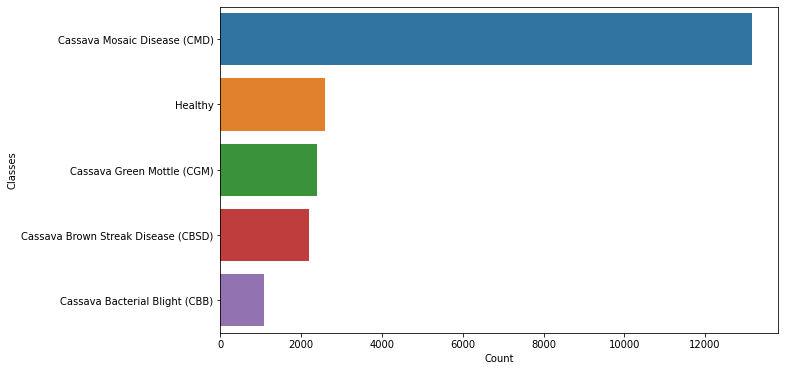

In [85]:
plt.figure(figsize=(10, 6))

sns.barplot(x='class', y='index', data=df_train['class'].value_counts().to_frame().reset_index())
plt.xlabel('Count')
plt.ylabel('Classes')
plt.show()

In [86]:
np.round((df_train['class'].value_counts() / len(df_train['class'])) * 100, 2)

Cassava Mosaic Disease (CMD)           61.49
Healthy                                12.04
Cassava Green Mottle (CGM)             11.15
Cassava Brown Streak Disease (CBSD)    10.23
Cassava Bacterial Blight (CBB)          5.08
Name: class, dtype: float64

We see that there is a heavy class imbalance in the dataset with class 3 (Cassava Mosaic Disease (CMD)) have]ing 61% of the dataset while class 0  (Cassava Bacterial Blight (CBB)) has only 5% of the dataset.

We should explore ways to balance this dataset

## Exploratory Data Analysis

In [87]:
path = "cassava-leaf-disease-classification"

In [88]:
def plot(images, labels, predictions = None):
    n_cols = min(3, len(images))
    n_rows = math.ceil(len(images) / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize = (21,16))

    if predictions is None:
              
        predictions = [None] * len(labels)


    for i, (x, y_true, y_pred) in enumerate(zip(images, labels, predictions)):
        
        ax = axes.flat[i]
        a = plt.imread(os.path.join(path,"train_images", x ))
        ax.imshow(a)

        
        ax.set_title(f"Class: {y_true}")
             
        if y_pred is not None:
            ax.set_xlabel(f"Pred: {y_pred}", color='blue', fontweight='bold')

        ax.set_xticks([])
        ax.set_yticks([])

### Samples of "0": "Cassava Bacterial Blight (CBB)"

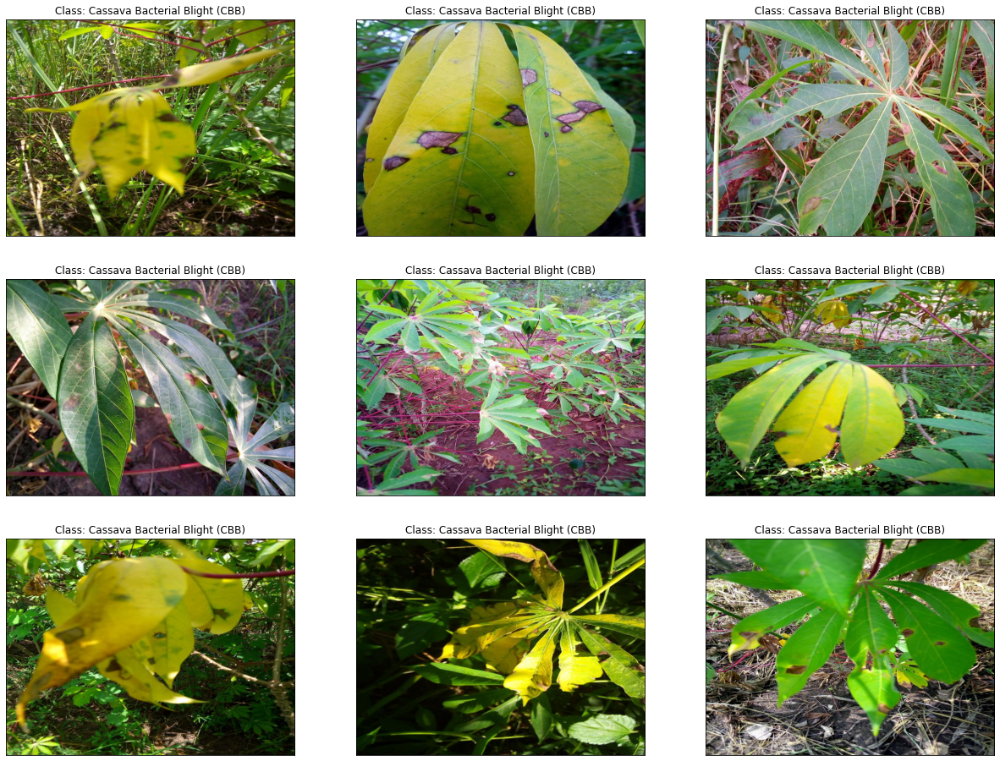

In [89]:
df_0 = df_train[df_train['label']==0]
df_0 = df_0.sample(9)
df_0_id = df_0['image_id'].values
df_0_class = df_0['class'].values

plot(df_0_id, df_0_class)

### Samples of "1": "Cassava Brown Streak Disease (CBSD)"

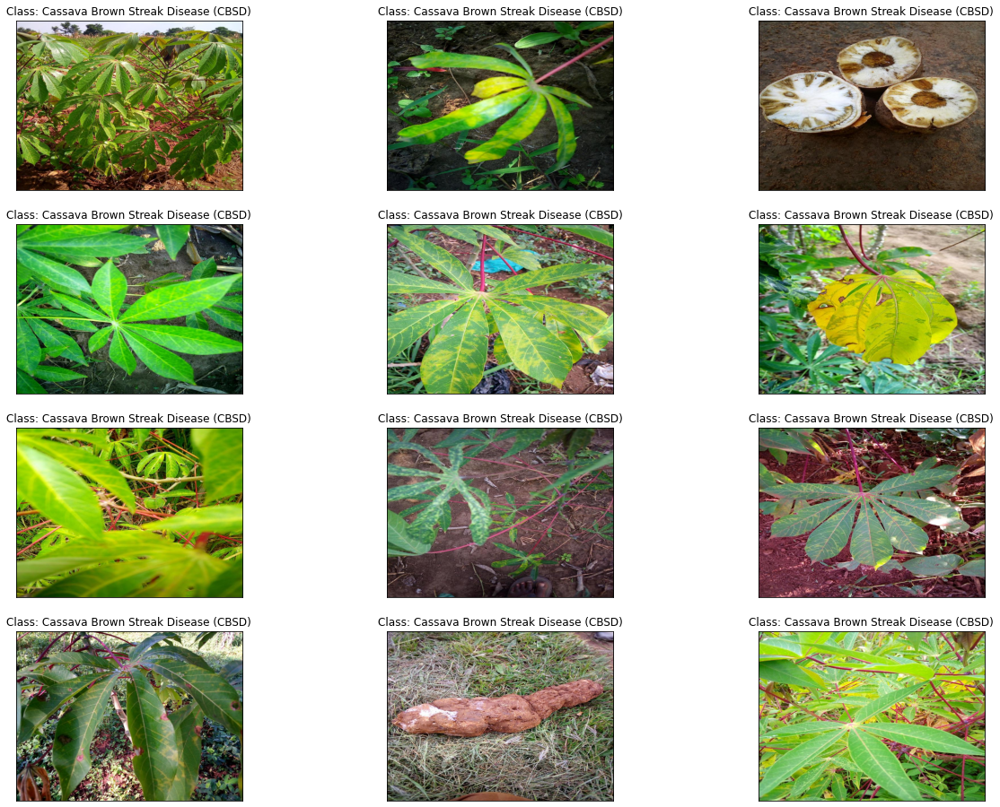

In [90]:
df_1 = df_train[df_train['label']==1]
df_1 = df_1.sample(12)
df_1_id = df_1['image_id'].values
df_1_class = df_1['class'].values

plot(df_1_id, df_1_class)

### Samples of "2": "Cassava Green Mottle (CGM)"

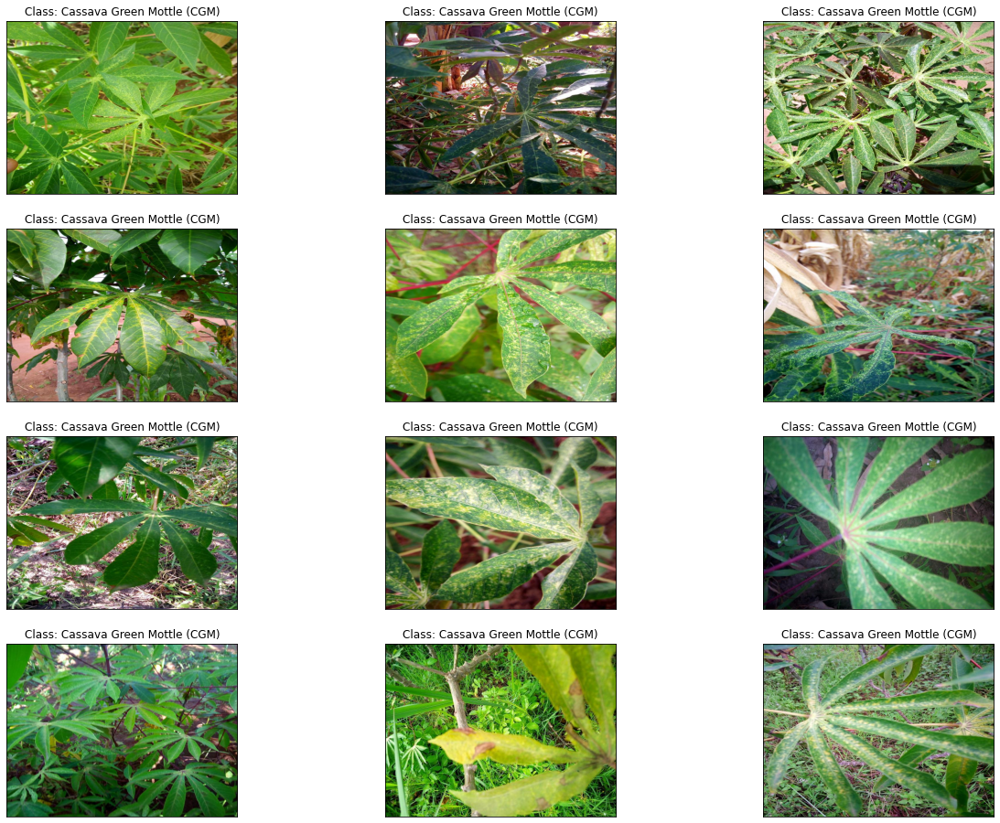

In [91]:
df_2 = df_train[df_train['label']==2]
df_2 = df_2.sample(12)
df_2_id = df_2['image_id'].values
df_2_class = df_2['class'].values

plot(df_2_id, df_2_class)

### Samples of   "3": "Cassava Mosaic Disease (CMD)"

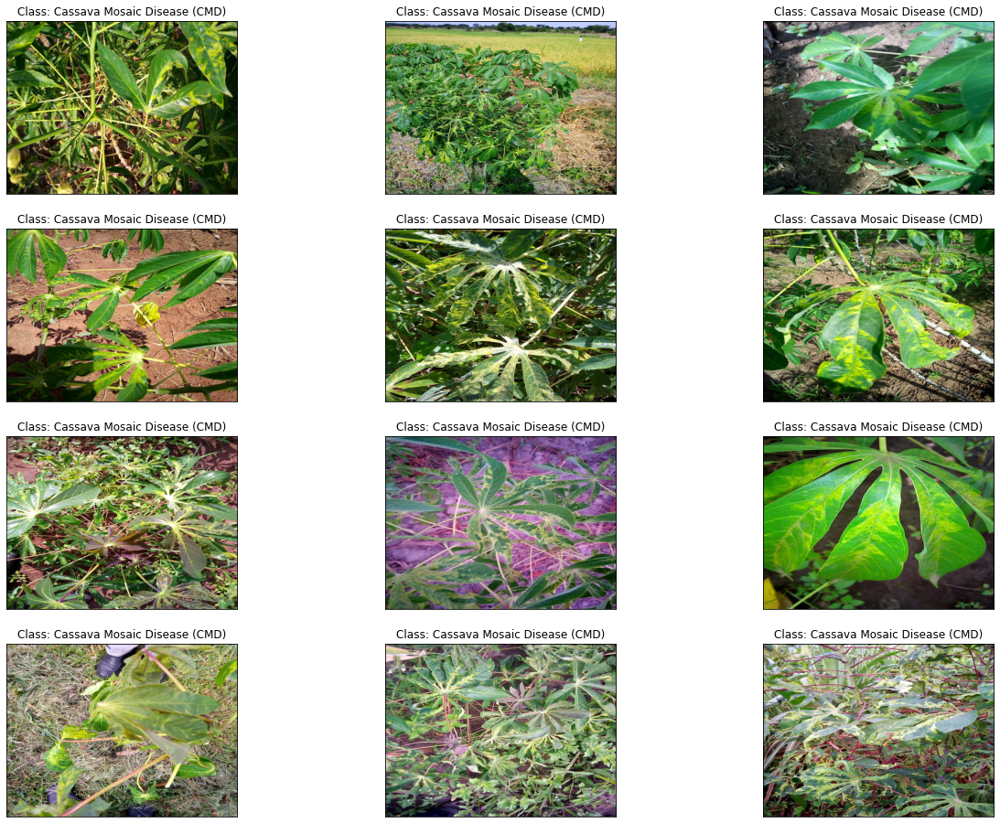

In [92]:
df_3 = df_train[df_train['label']==3]
df_3 = df_3.sample(12)
df_3_id = df_3['image_id'].values
df_3_class = df_3['class'].values

plot(df_3_id, df_3_class)

### Samples of "4": "Healthy"

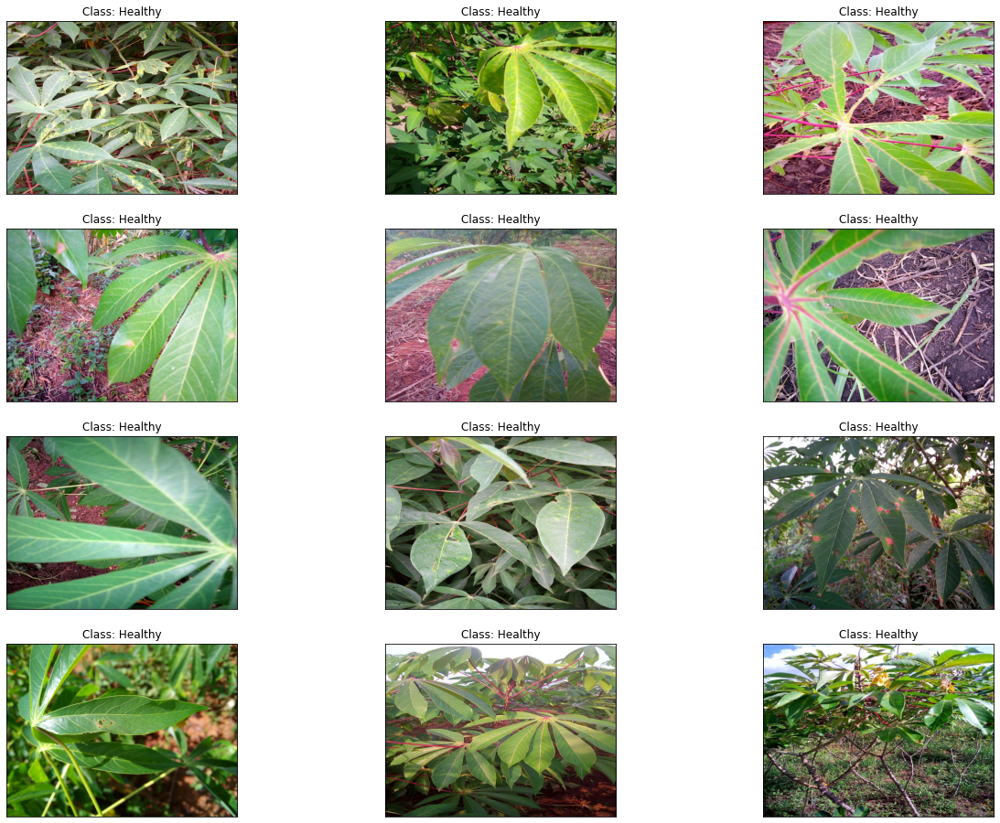

In [93]:
df_4 = df_train[df_train['label']==4]
df_4 = df_4.sample(12)
df_4_id = df_4['image_id'].values
df_4_class = df_4['class'].values

plot(df_4_id, df_4_class)

## Baseline Accuracy with Data Imbalance

In [94]:
y_pred = [3] * len(df_train.label)
print("The baseline accuracy is {}".format(accuracy_score(y_pred, df_train.label)))

The baseline accuracy is 0.6149460204701593


The default accuracy is 61% since label "3" represents 61% of the entire data, if we predict that all the leaves are in label "3", we get an accuracy of 61%.

## Handling Class Imbalance Using KFold Validation and ImageDataGenerator

In [95]:
def create_folds(df_train, n_split):
    df_train.loc[:, "kfold"] = -1
    df_train = df_train.sample(frac=1).reset_index(drop=True)
    SS = StratifiedKFold(n_splits=n_split)
    y = df_train.label.values
    for fold, (t_,v_) in enumerate((SS.split(X=df_train,y=y))):
        df_train.loc[v_, "kfold"] = fold
    return df_train

In [96]:
df_train['label'] = df_train['label'].astype('str')

In [97]:
df_train = create_folds(df_train, 5)
df_train.head(5)

,image_id,label,class,kfold
0,3962424026.jpg,3,Cassava Mosaic Disease (CMD),0
1,564511381.jpg,0,Cassava Bacterial Blight (CBB),0
2,541684272.jpg,3,Cassava Mosaic Disease (CMD),0
3,2442826642.jpg,3,Cassava Mosaic Disease (CMD),0
4,253146039.jpg,0,Cassava Bacterial Blight (CBB),0


In [98]:
df_train['kfold'].value_counts()

0    4280
1    4280
2    4279
3    4279
4    4279
Name: kfold, dtype: int64

## Apply Data Transforms and Specify Data Loaders

In [99]:
train_dir = 'cassava-leaf-disease-classification/train_images'

def data_generator(train, validation , batch_size, img_rows, img_cols):
        
        train_datagen = ImageDataGenerator(rescale=1./225,
                           rotation_range=40,
                           width_shift_range=0.2,
                           height_shift_range=0.2,
                           shear_range=0.2,
                           zoom_range=0.2,
                           horizontal_flip=True,)
        
        validation_datagen = ImageDataGenerator(rescale=1./255,)
        
        train_gen = train_datagen.flow_from_dataframe(train,
                                                    train_dir,
                                                    x_col = 'image_id',
                                                    y_col = 'label',
                                                    target_size=(img_rows, img_cols),
                                                    seed = 42,
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    interpolation = 'nearest',
                                                    shuffle=True)

        validation_gen = validation_datagen.flow_from_dataframe(validation,
                                                    train_dir,
                                                    x_col = 'image_id',
                                                    y_col = 'label',
                                                    target_size=(img_rows, img_cols),
                                                    seed = 42,
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    interpolation = 'nearest',
                                                    shuffle=False)
        
        return train_gen, validation_gen

## Base Model - CNN Model

### Model Architecture

In [23]:
def create_model():
    
    # Instantiate model
    model = models.Sequential()
    
    # Add Convolution layer first
    model.add(layers.Conv2D(filters=32, kernel_size=(3,3), input_shape=(224, 224, 3), activation="relu"))
    model.add(layers.MaxPool2D(pool_size=(2,2)))
    
    # Add Convolution layer first
    model.add(layers.Conv2D(filters=64, kernel_size=(3,3), activation="relu"))
    model.add(layers.MaxPool2D(pool_size=(2,2)))
    
    # Add Convolution layer first
    model.add(layers.Conv2D(filters=128, kernel_size=(3,3), activation="relu"))
    model.add(layers.MaxPool2D(pool_size=(2,2)))
    
    # Add Convolution layer first
    model.add(layers.Conv2D(filters=128, kernel_size=(3,3), activation="relu"))
    model.add(layers.MaxPool2D(pool_size=(2,2)))
    
    # Flatten out the model
    model.add(layers.Flatten())
    
    # Add Dense layer now
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dropout(0.5))
    
    # Add output layer
    model.add(layers.Dense(5, activation='softmax'))
    
    # Compile the model
    model.compile(optimizer='adam', loss = "categorical_crossentropy", metrics = ["accuracy"]) 
    
    return model

In [24]:
base_model = create_model()

In [25]:
base_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 26, 26, 128)      0

In [26]:
def train_model(df, batch_size, img_rows, img_cols, fold, model):
    
    t1_1 = datetime.now()
    
    train = df[df.kfold != fold].reset_index(drop=True)
    validation = df[df.kfold == fold].reset_index(drop=True)
    
    train_generator, validation_generator = data_generator(train, validation, batch_size, img_rows, img_cols)
    
    callback_list = [callbacks.EarlyStopping(monitor='val_accuracy', patience=3, mode='max', restore_best_weights=True),
                    callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, mode='min'),]
      
    history = model.fit(train_generator, validation_data=validation_generator, callbacks=callback_list, epochs=10)
    
    return model, history, train_generator, validation_generator

-------------------------
0-fold training
-------------------------
Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - 428s 781ms/step - loss: 1.1364 - accuracy: 0.6181 - val_loss: 1.0175 - val_accuracy: 0.6355 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - 243s 454ms/step - loss: 1.0157 - accuracy: 0.6304 - val_loss: 1.0112 - val_accuracy: 0.6456 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - 241s 450ms/step - loss: 0.9544 - accuracy: 0.6490 - val_loss: 0.9388 - val_accuracy: 0.6671 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - 331s 618ms/step - loss: 0.9030 - accuracy: 0.6640 - val_loss: 0.8801 - val_accuracy: 0.6685 - lr: 0.0010
Epoch 5/10
535/535 [==============================] - 243s 454ms/step - loss: 0.8647 - accuracy: 0.6732 - val_loss: 0.8245 - val_accuracy: 0.6797 - lr: 0.0010
Epoch 6/10
535

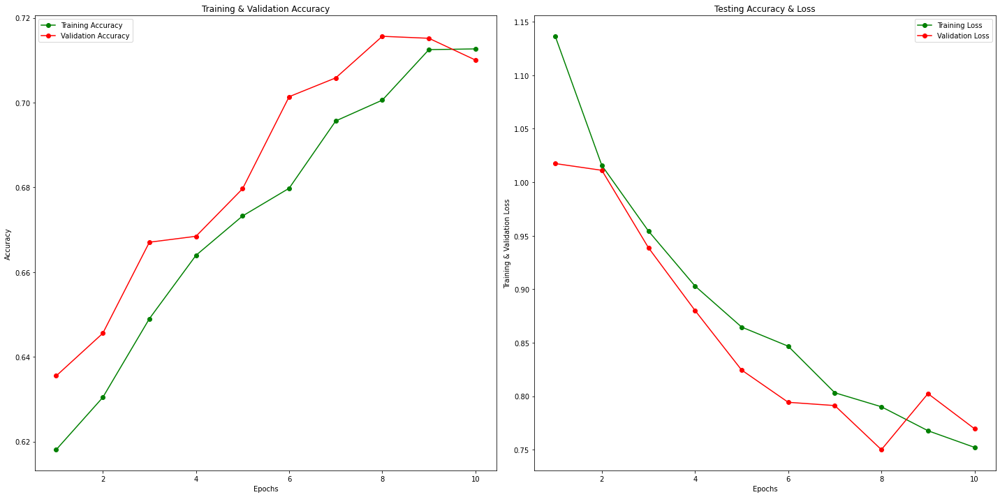

Model computation time: 0:43:29.213942
-------------------------
1-fold training
-------------------------
Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - 303s 567ms/step - loss: 0.7506 - accuracy: 0.7205 - val_loss: 0.7506 - val_accuracy: 0.7168 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - 215s 401ms/step - loss: 0.7290 - accuracy: 0.7274 - val_loss: 0.6631 - val_accuracy: 0.7530 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - 210s 393ms/step - loss: 0.7270 - accuracy: 0.7330 - val_loss: 0.6841 - val_accuracy: 0.7407 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - 210s 392ms/step - loss: 0.7119 - accuracy: 0.7392 - val_loss: 0.7100 - val_accuracy: 0.7327 - lr: 0.0010
Epoch 5/10
535/535 [==============================] - 211s 395ms/step - loss: 0.6984 - accuracy: 0.7432 - val_loss: 0.6367 - val_accur

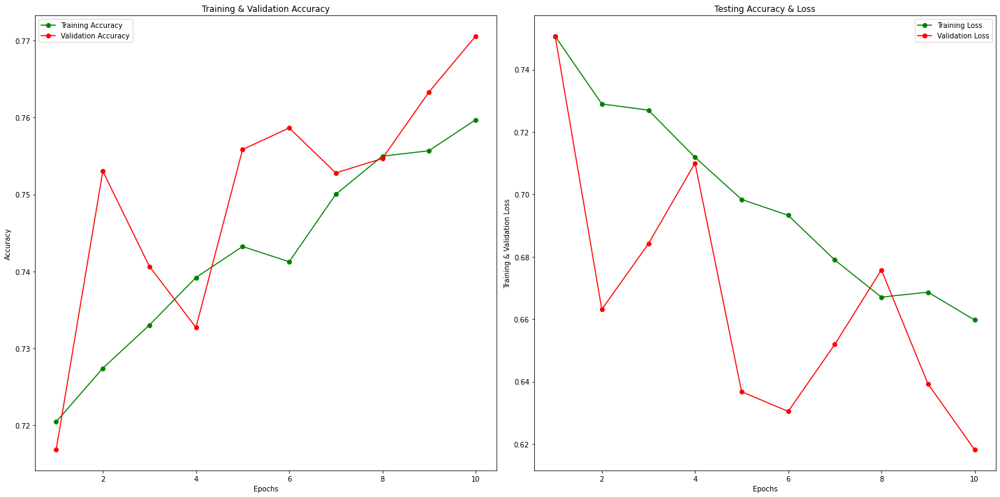

Model computation time: 0:36:45.557149
-------------------------
2-fold training
-------------------------
Found 17118 validated image filenames belonging to 5 classes.
Found 4279 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - 213s 398ms/step - loss: 0.6580 - accuracy: 0.7604 - val_loss: 0.6940 - val_accuracy: 0.7387 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - 211s 395ms/step - loss: 0.6548 - accuracy: 0.7627 - val_loss: 0.5889 - val_accuracy: 0.7906 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - 211s 394ms/step - loss: 0.6501 - accuracy: 0.7604 - val_loss: 0.5789 - val_accuracy: 0.7925 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - 212s 395ms/step - loss: 0.6444 - accuracy: 0.7657 - val_loss: 0.5513 - val_accuracy: 0.7997 - lr: 0.0010
Epoch 5/10
535/535 [==============================] - 211s 393ms/step - loss: 0.6369 - accuracy: 0.7708 - val_loss: 0.5918 - val_accur

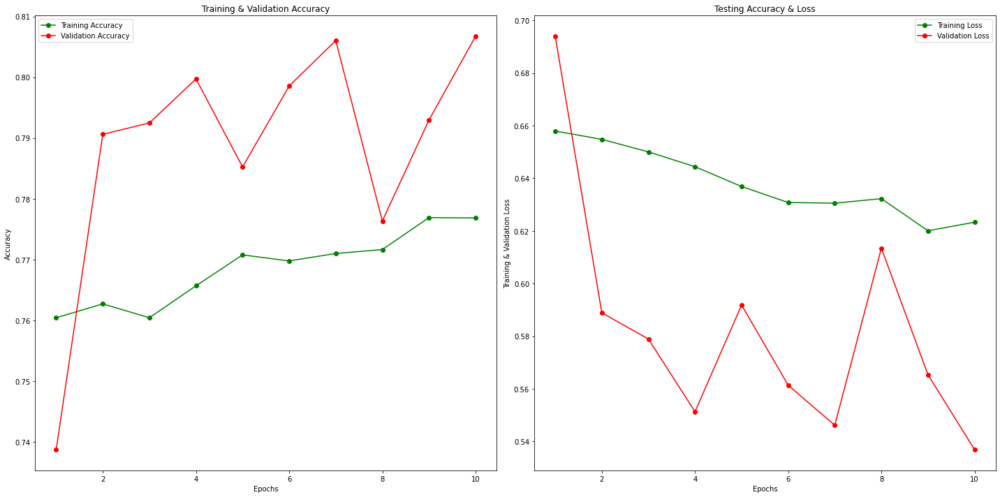

Model computation time: 0:35:54.543381
-------------------------
3-fold training
-------------------------
Found 17118 validated image filenames belonging to 5 classes.
Found 4279 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - 214s 399ms/step - loss: 0.6129 - accuracy: 0.7788 - val_loss: 0.5847 - val_accuracy: 0.7925 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - 212s 395ms/step - loss: 0.6065 - accuracy: 0.7802 - val_loss: 0.5854 - val_accuracy: 0.7976 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - 214s 400ms/step - loss: 0.6087 - accuracy: 0.7794 - val_loss: 0.6059 - val_accuracy: 0.7775 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - 222s 414ms/step - loss: 0.6094 - accuracy: 0.7844 - val_loss: 0.5728 - val_accuracy: 0.8018 - lr: 0.0010
Epoch 5/10
535/535 [==============================] - 215s 403ms/step - loss: 0.5976 - accuracy: 0.7853 - val_loss: 0.5545 - val_accur

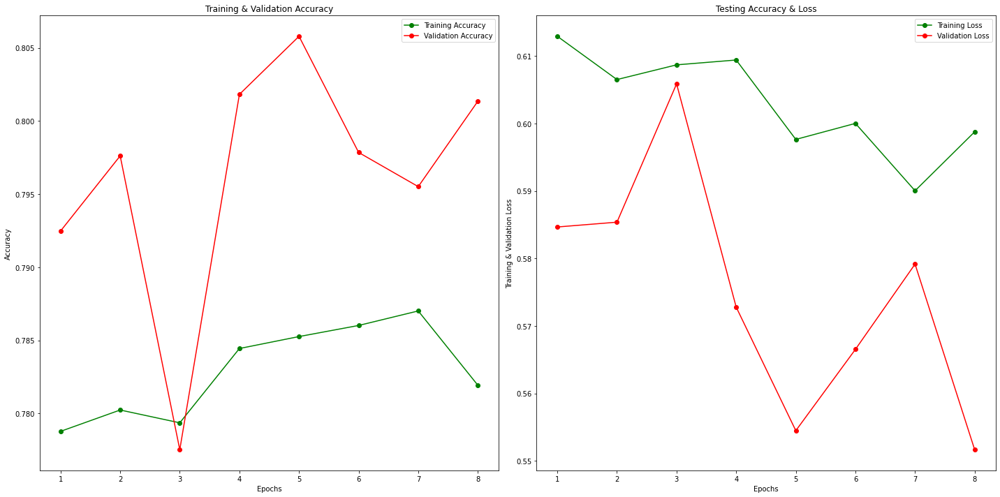

Model computation time: 0:28:51.432467
-------------------------
4-fold training
-------------------------
Found 17118 validated image filenames belonging to 5 classes.
Found 4279 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - 216s 404ms/step - loss: 0.5993 - accuracy: 0.7858 - val_loss: 0.5379 - val_accuracy: 0.8021 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - 216s 404ms/step - loss: 0.6005 - accuracy: 0.7883 - val_loss: 0.5534 - val_accuracy: 0.8011 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - 216s 404ms/step - loss: 0.6018 - accuracy: 0.7841 - val_loss: 0.5355 - val_accuracy: 0.8091 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - 212s 396ms/step - loss: 0.5904 - accuracy: 0.7884 - val_loss: 0.5503 - val_accuracy: 0.7981 - lr: 0.0010
Epoch 5/10
535/535 [==============================] - 216s 403ms/step - loss: 0.5872 - accuracy: 0.7895 - val_loss: 0.5715 - val_accur

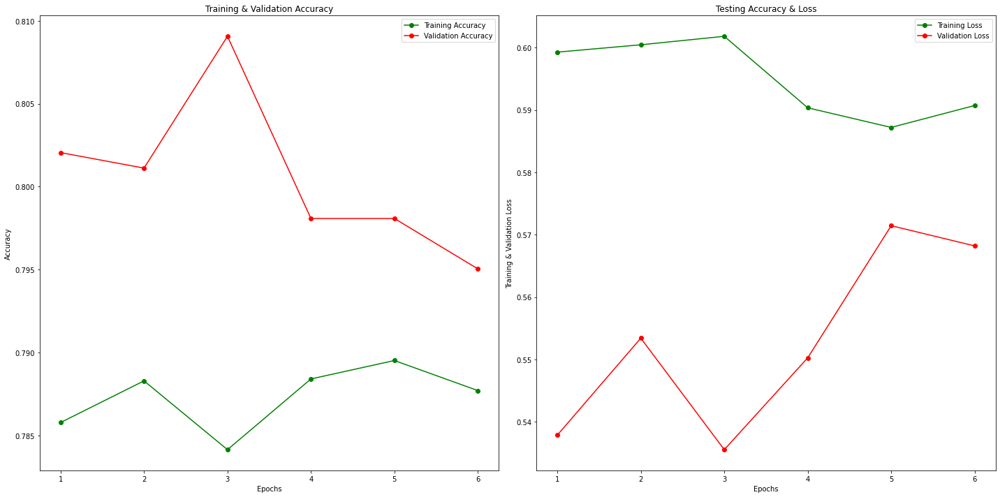

Model computation time: 0:21:37.290815


In [27]:
base_oof_acc=[]
base_oof_val_acc=[]
base_oof_loss=[]
base_oof_val_loss=[]
base_model_time = []

for i in range(5):
    
    t1_1 = datetime.now()
    
    print(25*"-")    
    print(f'{i}-fold training')
    print(25*"-")

    base_model, history, train_generator, validation_generator = train_model(df_train, 32, 224, 224, i, base_model)

    train_accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']

    base_oof_acc.append(train_accuracy)
    base_oof_val_acc.append(val_accuracy)
    base_oof_loss.append(train_loss)
    base_oof_val_loss.append(val_loss)

    epochs = range(1, len(train_accuracy) + 1)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    fig.set_size_inches(20,10)

    ax1.plot(epochs , train_accuracy , 'go-' , label = 'Training Accuracy')
    ax1.plot(epochs , val_accuracy , 'ro-' , label = 'Validation Accuracy')
    ax1.set_title('Training & Validation Accuracy')
    ax1.legend()
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")

    ax2.plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
    ax2.plot(epochs , val_loss , 'r-o' , label = 'Validation Loss')
    ax2.set_title('Testing Accuracy & Loss')
    ax2.legend()
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Training & Validation Loss")

    fig.tight_layout()
    plt.show()
    
    t2_1 = datetime.now()
    base_model_time.append(str(t2_1 - t1_1))
    print("Model computation time: " + str(t2_1 - t1_1))

In [28]:
base_acc_average = [sum(sub_list) / len(sub_list) for sub_list in base_oof_acc]
base_val_acc_average = [sum(sub_list) / len(sub_list) for sub_list in base_oof_val_acc]
base_loss_average = [sum(sub_list) / len(sub_list) for sub_list in base_oof_loss]
base_val_loss_average = [sum(sub_list) / len(sub_list) for sub_list in base_oof_val_loss]

In [29]:
print("Average training accuracy across 5 folds with ten epochs each -", base_acc_average)
print("Average validation accuracy across 5 folds with ten epochs each -", base_val_acc_average)
print("Average training loss across 5 folds with ten epochs each -", base_loss_average)
print("Average validation loss across 5 folds with ten epochs each -", base_val_loss_average)

Average training accuracy across 5 folds with ten epochs each - [0.6735993504524231, 0.7424957692623139, 0.768617820739746, 0.7828747481107712, 0.7873096466064453]
Average validation accuracy across 5 folds with ten epochs each - [0.6844392478466034, 0.7499065518379211, 0.788735693693161, 0.7962432727217674, 0.8005764583746592]
Average training loss across 5 folds with ten epochs each - [0.8834290742874146, 0.698450255393982, 0.6381091952323914, 0.6030057147145271, 0.5949724813302358]
Average validation loss across 5 folds with ten epochs each - [0.8579729080200196, 0.6660193741321564, 0.58280149102211, 0.5750746130943298, 0.5527976453304291]


In [30]:
base_model_time

['0:43:29.213942',
 '0:36:45.557149',
 '0:35:54.543381',
 '0:28:51.432467',
 '0:21:37.290815']

In [31]:
base_acc_average = [sum(sub_list) / len(sub_list) 
                    for sub_list in base_oof_acc]
base_acc_average

[0.6735993504524231,
 0.7424957692623139,
 0.768617820739746,
 0.7828747481107712,
 0.7873096466064453]

In [32]:
print("KFold Validation Accuracy: ", np.hstack(base_oof_acc).mean())

KFold Validation Accuracy:  0.7462269379334017


In [33]:
Y_pred = base_model.predict_generator(validation_generator)
y_pred = np.argmax(Y_pred, axis=1)
print('Classification Report')
target_names = list(train_generator.class_indices.keys()) # Classes
print(classification_report(validation_generator.classes, y_pred, target_names=target_names))

Classification Report
              precision    recall  f1-score   support

           0       0.50      0.49      0.50       217
           1       0.73      0.65      0.69       438
           2       0.76      0.49      0.60       478
           3       0.87      0.98      0.92      2631
           4       0.64      0.53      0.58       515

    accuracy                           0.81      4279
   macro avg       0.70      0.63      0.66      4279
weighted avg       0.80      0.81      0.80      4279



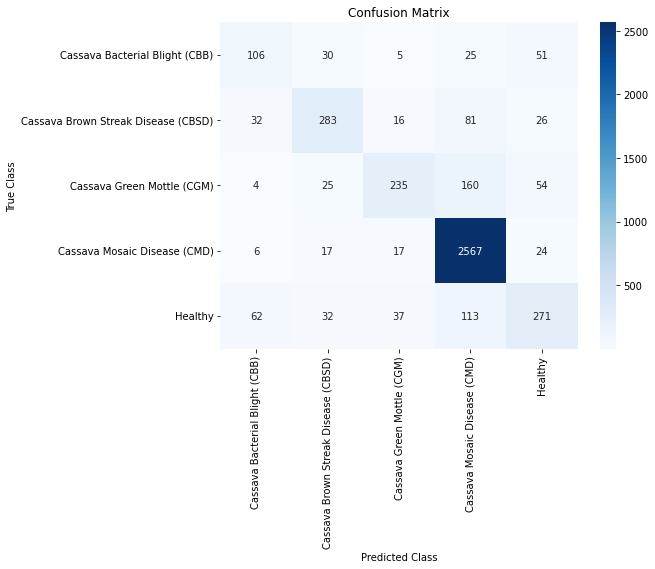

In [34]:
cm = confusion_matrix(validation_generator.classes, y_pred)
labels = ['Cassava Bacterial Blight (CBB)', 'Cassava Brown Streak Disease (CBSD)', 'Cassava Green Mottle (CGM)', 'Cassava Mosaic Disease (CMD)','Healthy']
plt.figure(figsize=(8,6))
sns.heatmap(cm,xticklabels=labels, yticklabels=labels, annot=True, fmt='d', cmap="Blues", vmin = 0.2);
plt.title('Confusion Matrix')
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.show()

In [35]:
pred = pd.DataFrame(y_pred, columns=['class_pred'])
pred['pred'] = pred['class_pred'].map({int(i) : c for i, c in disease_class.items()})

In [36]:
validation = df_train[df_train.kfold == 4].reset_index(drop=True)

image_ids_test = validation["image_id"].values
labels_test = validation["class"].values
pred_result = pred['pred'].values

In [37]:
rand_idxs = np.random.permutation(len(validation))[:9]

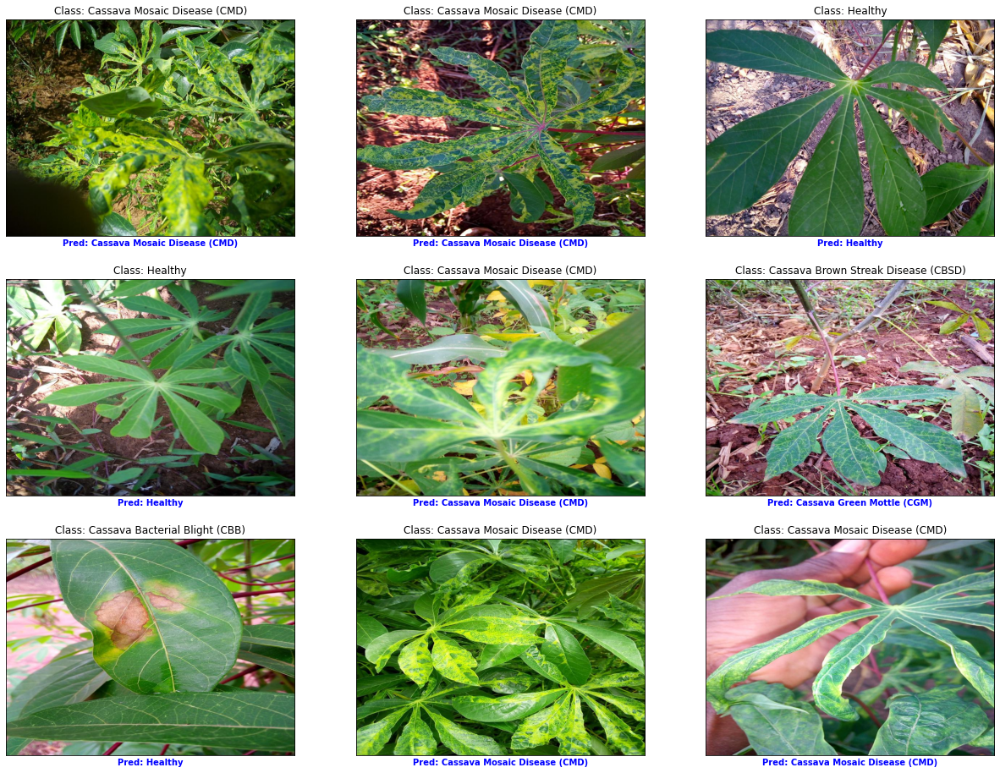

In [38]:
plot(image_ids_test[rand_idxs], labels_test[rand_idxs], pred_result[rand_idxs])
plt.show()

## Transfer Learning

Here pretrained models will be used to train the dataset. Three models will be tested and compared against each other - namely VGG 16, ResNet50 and EfficientNetB3

### VGG-16 Model Architecture

In [62]:
def create_model():

    # import model
    vgg16 = applications.VGG16(include_top = False, weights = 'imagenet',
                                                input_tensor = keras.Input(shape=(224, 224, 3)))
    # freeze some convolution blocks
    for layer in vgg16.layers[:-3]: 
        layer.trainable = False
    
    # define inputs
    inputs = layers.Input(shape=(224, 224, 3))
    
    # call the base model on inputs
    x = vgg16(inputs)


    # Fine-tuning
      # Combos
    x = layers.GlobalAveragePooling2D()(x) #add global average pooling layer 
    x = layers.Dense(128, activation='relu')(x) 
    x = layers.Dropout(rate = 0.5)(x)
    x = layers.ReLU()(x)
   
    # Output layer - output dimension=5 because we have 5 classes
    outputs = layers.Dense(5, activation = "softmax")(x)

    # Put the model together
    model = keras.Model(inputs=inputs, outputs=outputs)
    
    # compile model with Adam, categorical_crossentropy loss, and accuracy metric
    model.compile(optimizer="adam", loss='categorical_crossentropy', metrics=['accuracy'])
 
    return model

In [63]:
vgg16_model = create_model()
vgg16_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense_2 (Dense)             (None, 128)               65664     
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 re_lu (ReLU)                (None, 128)               0         
                                                             

In [66]:
def train_model(df, batch_size, img_rows, img_cols, fold, model):
    
    train = df[df.kfold != fold].reset_index(drop=True)
    validation = df[df.kfold == fold].reset_index(drop=True)
    
    train_generator, validation_generator = data_generator(train, validation, batch_size, img_rows, img_cols)
    
    callback_list = [callbacks.EarlyStopping(monitor='val_accuracy',patience=3, mode='max', restore_best_weights=True),
                    callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, mode='min'),]
    
    
    history = model.fit(train_generator, validation_data=validation_generator, callbacks=callback_list, epochs=10)
    
    return model, history, train_generator, validation_generator

-------------------------
0-fold training
-------------------------
Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - 341s 629ms/step - loss: 0.9765 - accuracy: 0.6467 - val_loss: 0.8794 - val_accuracy: 0.6678 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - 255s 476ms/step - loss: 0.8757 - accuracy: 0.6707 - val_loss: 0.8313 - val_accuracy: 0.6874 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - 254s 475ms/step - loss: 0.8127 - accuracy: 0.6977 - val_loss: 0.7561 - val_accuracy: 0.7159 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - 260s 487ms/step - loss: 0.7572 - accuracy: 0.7240 - val_loss: 0.7190 - val_accuracy: 0.7350 - lr: 0.0010
Epoch 5/10
535/535 [==============================] - 259s 484ms/step - loss: 0.7331 - accuracy: 0.7342 - val_loss: 0.7016 - val_accuracy: 0.7348 - lr: 0.0010
Epoch 6/10
535

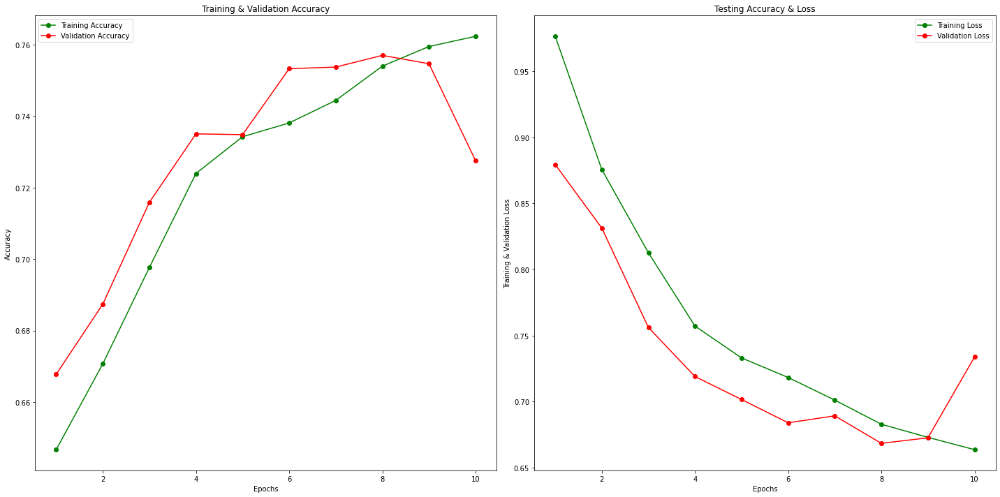

Model computation time: 0:46:01.294186
-------------------------
1-fold training
-------------------------
Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - 266s 497ms/step - loss: 0.6588 - accuracy: 0.7626 - val_loss: 0.5763 - val_accuracy: 0.7904 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - 265s 495ms/step - loss: 0.6583 - accuracy: 0.7661 - val_loss: 0.6864 - val_accuracy: 0.7395 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - 266s 497ms/step - loss: 0.6481 - accuracy: 0.7647 - val_loss: 0.5932 - val_accuracy: 0.7773 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - 265s 495ms/step - loss: 0.6357 - accuracy: 0.7702 - val_loss: 0.6072 - val_accuracy: 0.7806 - lr: 0.0010


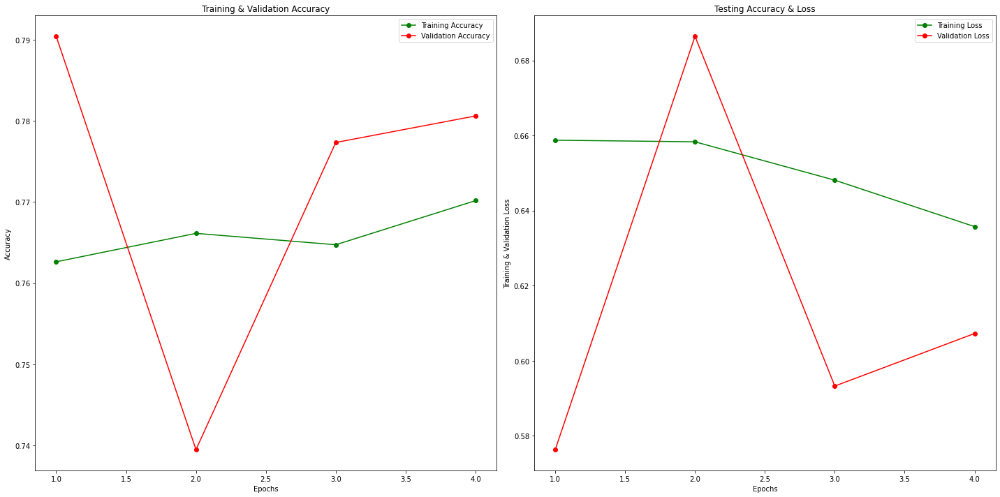

Model computation time: 0:17:44.577513
-------------------------
2-fold training
-------------------------
Found 17118 validated image filenames belonging to 5 classes.
Found 4279 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - 274s 511ms/step - loss: 0.6432 - accuracy: 0.7677 - val_loss: 0.6198 - val_accuracy: 0.7803 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - 265s 496ms/step - loss: 0.6387 - accuracy: 0.7680 - val_loss: 0.7312 - val_accuracy: 0.7425 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - 266s 497ms/step - loss: 0.6318 - accuracy: 0.7686 - val_loss: 0.6355 - val_accuracy: 0.7705 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - 265s 495ms/step - loss: 0.6268 - accuracy: 0.7728 - val_loss: 0.6999 - val_accuracy: 0.7579 - lr: 0.0010


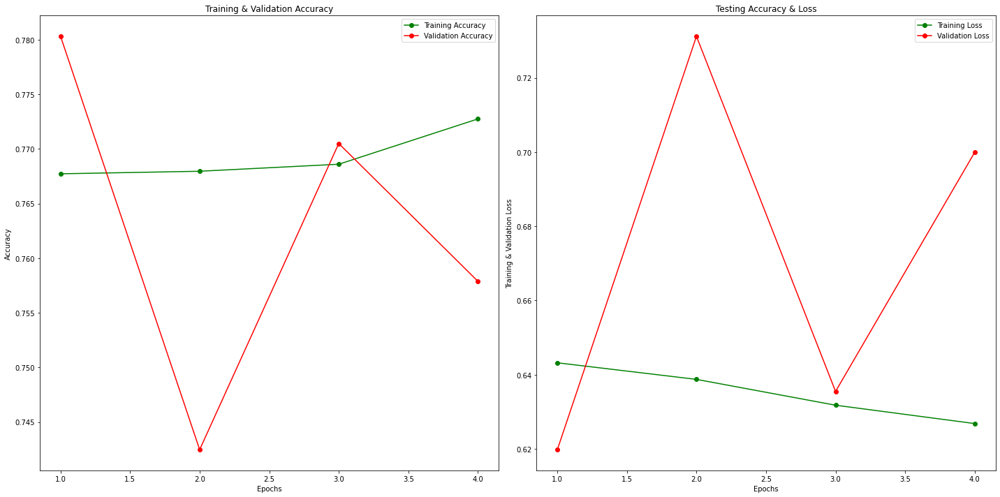

Model computation time: 0:17:52.563290
-------------------------
3-fold training
-------------------------
Found 17118 validated image filenames belonging to 5 classes.
Found 4279 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - 266s 497ms/step - loss: 0.6492 - accuracy: 0.7638 - val_loss: 0.5841 - val_accuracy: 0.7859 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - 266s 498ms/step - loss: 0.6421 - accuracy: 0.7701 - val_loss: 0.5993 - val_accuracy: 0.7843 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - 269s 502ms/step - loss: 0.6374 - accuracy: 0.7742 - val_loss: 0.6030 - val_accuracy: 0.7763 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - 271s 507ms/step - loss: 0.6228 - accuracy: 0.7784 - val_loss: 0.6582 - val_accuracy: 0.7584 - lr: 0.0010


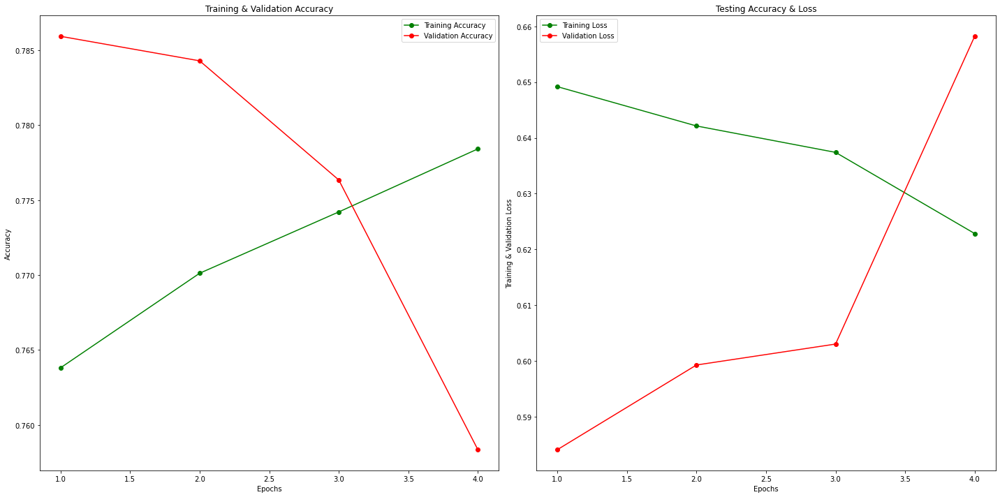

Model computation time: 0:17:55.438135
-------------------------
4-fold training
-------------------------
Found 17118 validated image filenames belonging to 5 classes.
Found 4279 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - 276s 516ms/step - loss: 0.6366 - accuracy: 0.7722 - val_loss: 0.6713 - val_accuracy: 0.7607 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - 273s 510ms/step - loss: 0.6409 - accuracy: 0.7704 - val_loss: 0.6937 - val_accuracy: 0.7348 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - 270s 505ms/step - loss: 0.6252 - accuracy: 0.7719 - val_loss: 0.6086 - val_accuracy: 0.7686 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - 265s 496ms/step - loss: 0.6228 - accuracy: 0.7771 - val_loss: 0.6335 - val_accuracy: 0.7735 - lr: 0.0010
Epoch 5/10
535/535 [==============================] - 266s 498ms/step - loss: 0.6112 - accuracy: 0.7815 - val_loss: 0.6138 - val_accur

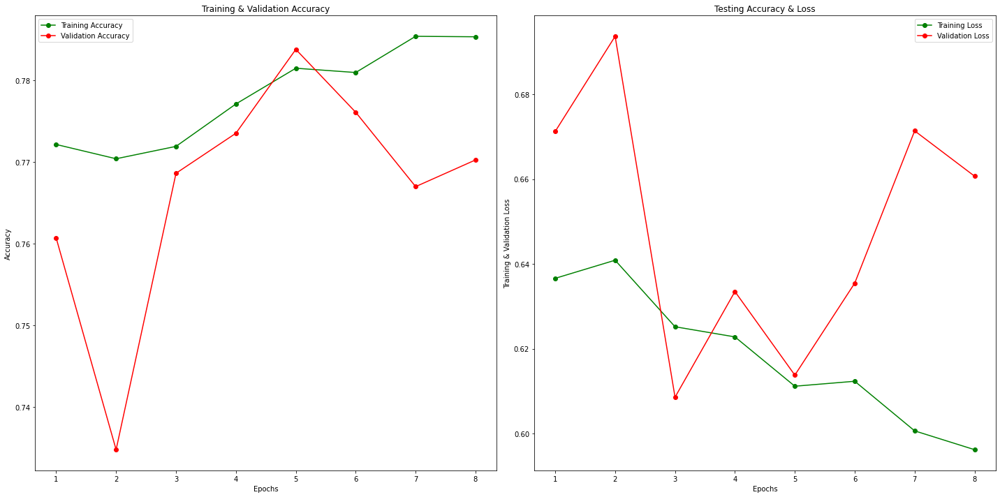

Model computation time: 0:36:03.863950


In [67]:
vgg_oof_acc=[]
vgg_oof_val_acc=[]
vgg_oof_loss=[]
vgg_oof_val_loss=[]
vgg_model_time = []

for i in range(5):
    
    t1_1 = datetime.now()
    
    print(25*"-")    
    print(f'{i}-fold training')
    print(25*"-")

    vgg_model, history, train_generator, validation_generator = train_model(df_train, 32, 224, 224, i, vgg16_model)

    train_accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']

    vgg_oof_acc.append(train_accuracy)
    vgg_oof_val_acc.append(val_accuracy)
    vgg_oof_loss.append(train_loss)
    vgg_oof_val_loss.append(val_loss)

    epochs = range(1, len(train_accuracy) + 1)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    fig.set_size_inches(20,10)

    ax1.plot(epochs , train_accuracy , 'go-' , label = 'Training Accuracy')
    ax1.plot(epochs , val_accuracy , 'ro-' , label = 'Validation Accuracy')
    ax1.set_title('Training & Validation Accuracy')
    ax1.legend()
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")

    ax2.plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
    ax2.plot(epochs , val_loss , 'r-o' , label = 'Validation Loss')
    ax2.set_title('Testing Accuracy & Loss')
    ax2.legend()
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Training & Validation Loss")

    fig.tight_layout()
    plt.show()
    
    t2_1 = datetime.now()
    vgg_model_time.append(str(t2_1 - t1_1))
    print("Model computation time: " + str(t2_1 - t1_1))

In [68]:
vgg_acc_average = [sum(sub_list) / len(sub_list) for sub_list in vgg_oof_acc]
vgg_val_acc_average = [sum(sub_list) / len(sub_list) for sub_list in vgg_oof_val_acc]
vgg_loss_average = [sum(sub_list) / len(sub_list) for sub_list in vgg_oof_loss]
vgg_val_loss_average = [sum(sub_list) / len(sub_list) for sub_list in vgg_oof_val_loss]

In [69]:
print("Average training accuracy across 5 folds with ten epochs each", vgg_acc_average)
print("Average validation accuracy across 5 folds with ten epochs each", vgg_val_acc_average)
print("Average training loss across 5 folds with ten epochs each", vgg_loss_average)
print("Average validation loss across 5 folds with ten epochs each", vgg_val_loss_average)

Average training accuracy across 5 folds with ten epochs each [0.7231524229049683, 0.7659198492765427, 0.7692633420228958, 0.7716438919305801, 0.7781209945678711]
Average validation accuracy across 5 folds with ten epochs each [0.7287149608135224, 0.7719626128673553, 0.7627950459718704, 0.7762327641248703, 0.7668555751442909]
Average training loss across 5 folds with ten epochs each [0.7594117820262909, 0.6502307951450348, 0.6351274400949478, 0.637892872095108, 0.6182325780391693]
Average validation loss across 5 folds with ten epochs each [0.733584749698639, 0.6158053278923035, 0.6715889424085617, 0.6111502051353455, 0.6485500112175941]


In [70]:
vgg_model_time

['0:46:01.294186',
 '0:17:44.577513',
 '0:17:52.563290',
 '0:17:55.438135',
 '0:36:03.863950']

In [71]:
print("KFold Validation Accuracy: ", np.hstack(vgg_oof_acc).mean())

KFold Validation Accuracy:  0.7561266839504241


In [72]:
Y_pred = vgg_model.predict_generator(validation_generator)
y_pred = np.argmax(Y_pred, axis=1)
print('Classification Report')
target_names = list(train_generator.class_indices.keys()) # Classes
print(classification_report(validation_generator.classes, y_pred, target_names=target_names))

Classification Report
              precision    recall  f1-score   support

           0       0.57      0.50      0.53       217
           1       0.68      0.52      0.59       437
           2       0.66      0.43      0.52       478
           3       0.91      0.92      0.92      2632
           4       0.49      0.74      0.59       515

    accuracy                           0.78      4279
   macro avg       0.66      0.62      0.63      4279
weighted avg       0.79      0.78      0.78      4279



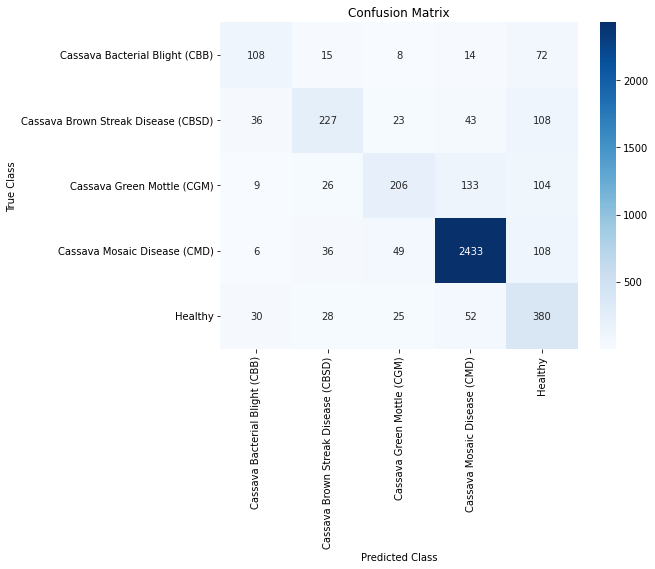

In [73]:
cm = confusion_matrix(validation_generator.classes, y_pred)
labels = ['Cassava Bacterial Blight (CBB)', 'Cassava Brown Streak Disease (CBSD)', 'Cassava Green Mottle (CGM)', 'Cassava Mosaic Disease (CMD)','Healthy']
plt.figure(figsize=(8,6))
sns.heatmap(cm,xticklabels=labels, yticklabels=labels, annot=True, fmt='d', cmap="Blues", vmin = 0.2);
plt.title('Confusion Matrix')
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.show()

In [74]:
pred = pd.DataFrame(y_pred, columns=['class_pred'])
pred['pred'] = pred['class_pred'].map({int(i) : c for i, c in disease_class.items()})

In [75]:
validation = df_train[df_train.kfold == 4].reset_index(drop=True)

image_ids_test = validation["image_id"].values
labels_test = validation["class"].values
pred_result = pred['pred'].values

In [76]:
rand_idxs = np.random.permutation(len(validation))[:9]

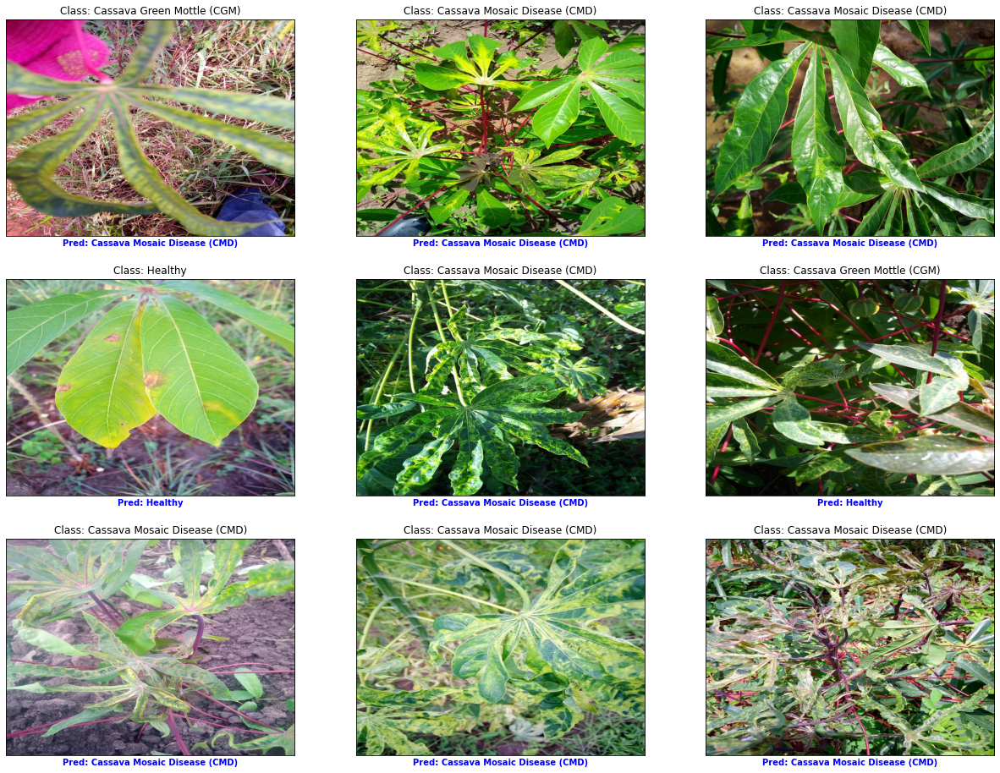

In [77]:
plot(image_ids_test[rand_idxs], labels_test[rand_idxs], pred_result[rand_idxs])
plt.show()

#### ResNet Model Architecture

In [100]:
def create_model():

    # import model
    restnet101 = applications.ResNet101V2(include_top = False, weights = 'imagenet', 
                                                input_tensor = keras.Input(shape=(224, 224, 3)))
    # freeze some convolution blocks
    for layer in restnet101.layers[:-13]: 
        layer.trainable = False
    # check frozen layers
#     for i, layer in enumerate(restnet101.layers):
#         print(i, layer.name, layer.trainable)
    
    # define inputs
    inputs = layers.Input(shape=(224, 224, 3))
    # call the base model on x
    x = restnet101(inputs)


    # Fine-tuning
      # Combos
    x = layers.GlobalAveragePooling2D(name="avg_pool")(x)
    x = layers.Dense(256, activation = "relu")(x)
    x = layers.Dense(256, activation = "relu")(x)
    x = layers.Dropout(0.2)(x)
    x = layers.ReLU()(x)
    # Output layer - output dimension=5 because we have 5 classes
    outputs = layers.Dense(5, activation="softmax", name="pred")(x)

    # Put the model together
    model = keras.Model(inputs, outputs, name="EfficientNet")
    # Compile
    model.compile(optimizer='adam', loss = "categorical_crossentropy", metrics = ["accuracy"]) 
 
    return model
     

In [101]:
resnet_model = create_model()
resnet_model.summary()

Model: "EfficientNet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 resnet101v2 (Functional)    (None, 7, 7, 2048)        42626560  
                                                                 
 avg_pool (GlobalAveragePool  (None, 2048)             0         
 ing2D)                                                          
                                                                 
 dense_4 (Dense)             (None, 256)               524544    
                                                                 
 dense_5 (Dense)             (None, 256)               65792     
                                                                 
 dropout_2 (Dropout)         (None, 256)               0         
                                                      

In [102]:
def train_model(df, batch_size, img_rows, img_cols, fold, model):
    
    t1_1 = datetime.now()
    
    train = df[df.kfold != fold].reset_index(drop=True)
    validation = df[df.kfold == fold].reset_index(drop=True)
    
    train_generator, validation_generator = data_generator(train, validation, batch_size, img_rows, img_cols)
    
    callback_list = [callbacks.EarlyStopping(monitor='val_accuracy',patience=3, mode='max', restore_best_weights=True),
                    callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, mode='min'),]
      
    history = model.fit(train_generator, validation_data=validation_generator, callbacks=callback_list, epochs=10)
    
    return model, history, train_generator, validation_generator

-------------------------
0-fold training
-------------------------
Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - 266s 482ms/step - loss: 0.8736 - accuracy: 0.6922 - val_loss: 0.8093 - val_accuracy: 0.6902 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - 263s 491ms/step - loss: 0.7552 - accuracy: 0.7296 - val_loss: 0.7880 - val_accuracy: 0.6998 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - 269s 503ms/step - loss: 0.7026 - accuracy: 0.7442 - val_loss: 0.7955 - val_accuracy: 0.7168 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - 264s 493ms/step - loss: 0.6829 - accuracy: 0.7552 - val_loss: 0.7684 - val_accuracy: 0.7435 - lr: 0.0010
Epoch 5/10
535/535 [==============================] - 275s 514ms/step - loss: 0.6560 - accuracy: 0.7635 - val_loss: 0.6981 - val_accuracy: 0.7472 - lr: 0.0010
Epoch 6/10
535

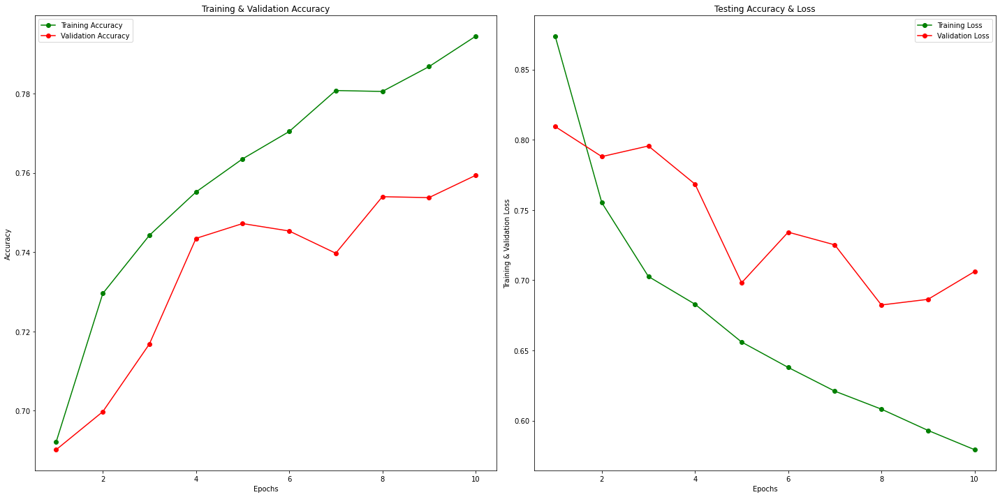

Model computation time: 0:44:23.612612
-------------------------
1-fold training
-------------------------
Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - 267s 497ms/step - loss: 0.5948 - accuracy: 0.7869 - val_loss: 0.5551 - val_accuracy: 0.7967 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - 280s 523ms/step - loss: 0.5852 - accuracy: 0.7911 - val_loss: 0.5148 - val_accuracy: 0.8157 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - 297s 555ms/step - loss: 0.5668 - accuracy: 0.7977 - val_loss: 0.5590 - val_accuracy: 0.8000 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - 303s 566ms/step - loss: 0.5580 - accuracy: 0.8020 - val_loss: 0.5911 - val_accuracy: 0.7876 - lr: 0.0010
Epoch 5/10
535/535 [==============================] - 400s 747ms/step - loss: 0.5405 - accuracy: 0.8050 - val_loss: 0.5973 - val_accur

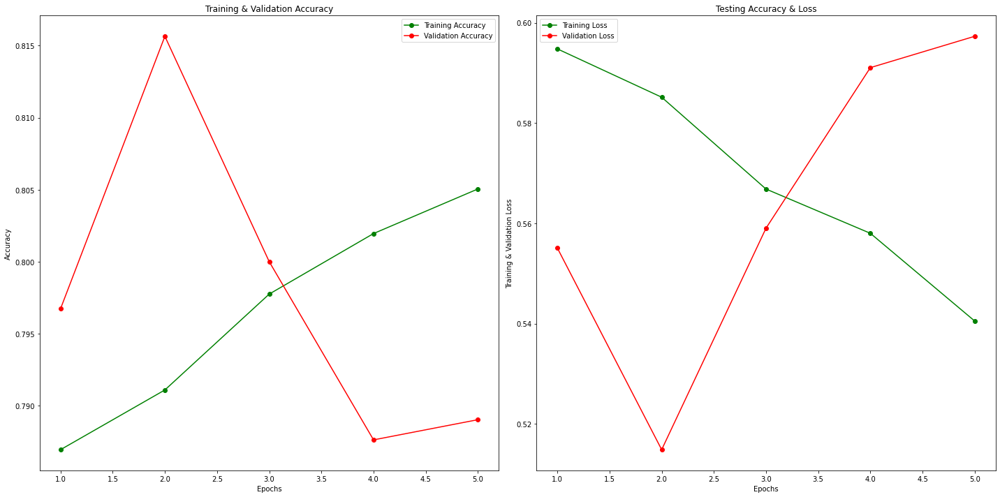

Model computation time: 0:25:49.166812
-------------------------
2-fold training
-------------------------
Found 17118 validated image filenames belonging to 5 classes.
Found 4279 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - 365s 682ms/step - loss: 0.5772 - accuracy: 0.7907 - val_loss: 0.5192 - val_accuracy: 0.8121 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - 421s 787ms/step - loss: 0.5610 - accuracy: 0.7982 - val_loss: 0.5498 - val_accuracy: 0.8091 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - 317s 593ms/step - loss: 0.5452 - accuracy: 0.8055 - val_loss: 0.5535 - val_accuracy: 0.8037 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - 326s 610ms/step - loss: 0.5409 - accuracy: 0.8066 - val_loss: 0.5287 - val_accuracy: 0.8102 - lr: 0.0010


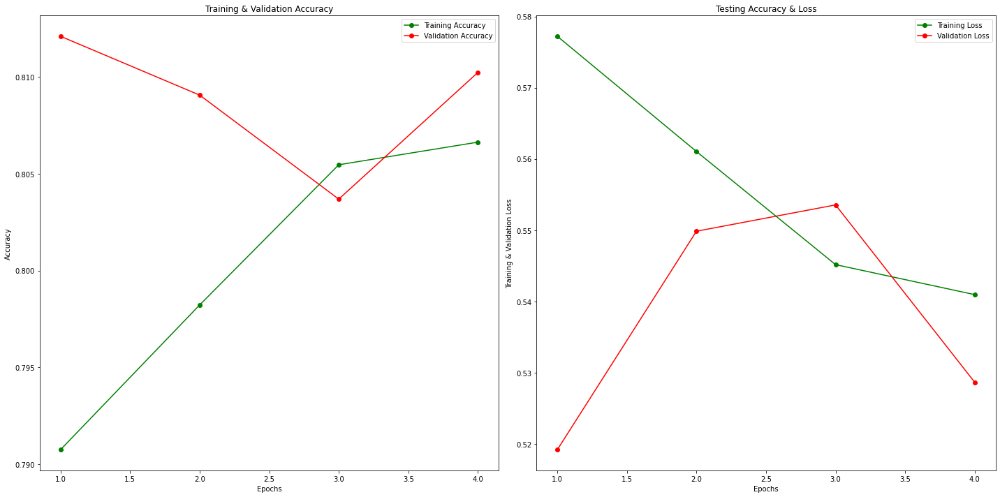

Model computation time: 0:23:53.742438
-------------------------
3-fold training
-------------------------
Found 17118 validated image filenames belonging to 5 classes.
Found 4279 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - 304s 568ms/step - loss: 0.5661 - accuracy: 0.7980 - val_loss: 0.5575 - val_accuracy: 0.7978 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - 454s 848ms/step - loss: 0.5543 - accuracy: 0.8013 - val_loss: 0.5326 - val_accuracy: 0.8032 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - 328s 614ms/step - loss: 0.5391 - accuracy: 0.8057 - val_loss: 0.5566 - val_accuracy: 0.8063 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - 294s 549ms/step - loss: 0.5299 - accuracy: 0.8111 - val_loss: 0.5868 - val_accuracy: 0.7901 - lr: 0.0010
Epoch 5/10
535/535 [==============================] - 291s 545ms/step - loss: 0.5145 - accuracy: 0.8170 - val_loss: 0.5164 - val_accur

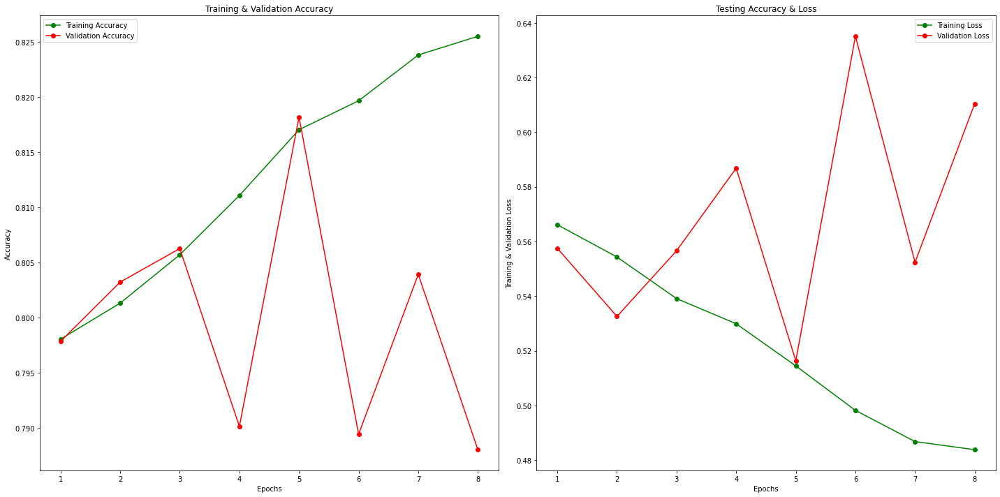

Model computation time: 0:43:03.921404
-------------------------
4-fold training
-------------------------
Found 17118 validated image filenames belonging to 5 classes.
Found 4279 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - 323s 602ms/step - loss: 0.5238 - accuracy: 0.8138 - val_loss: 0.4760 - val_accuracy: 0.8259 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - 320s 599ms/step - loss: 0.5023 - accuracy: 0.8186 - val_loss: 0.4559 - val_accuracy: 0.8343 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - 306s 572ms/step - loss: 0.4884 - accuracy: 0.8239 - val_loss: 0.5410 - val_accuracy: 0.8088 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - 308s 576ms/step - loss: 0.4877 - accuracy: 0.8236 - val_loss: 0.4971 - val_accuracy: 0.8240 - lr: 0.0010
Epoch 5/10
535/535 [==============================] - 319s 596ms/step - loss: 0.4621 - accuracy: 0.8339 - val_loss: 0.5263 - val_accur

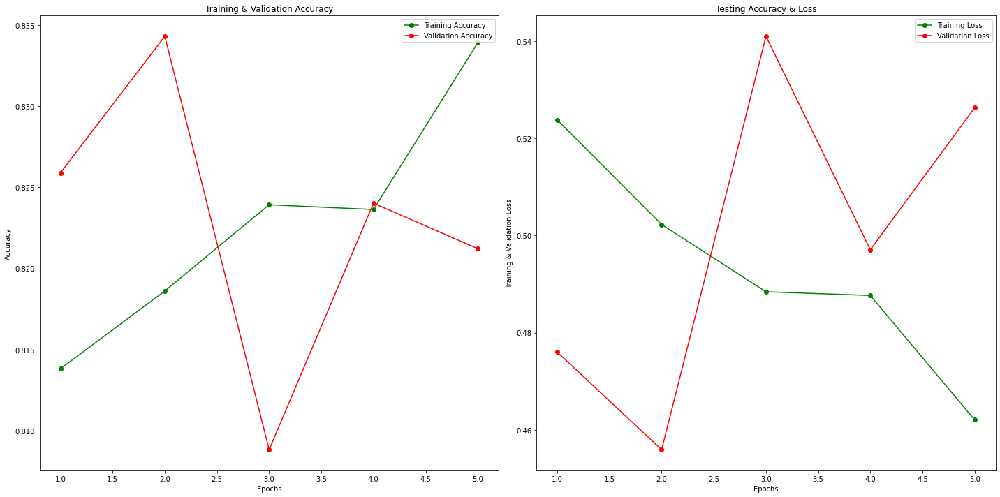

Model computation time: 0:26:20.290607


In [103]:
resnet_oof_acc=[]
resnet_oof_val_acc=[]
resnet_oof_loss=[]
resnet_oof_val_loss=[]
resnet_model_time = []

for i in range(5):
    
    t1_1 = datetime.now()
    
    print(25*"-")    
    print(f'{i}-fold training')
    print(25*"-")

    resnet_model, history, train_generator, validation_generator = train_model(df_train, 32, 224, 224, i, resnet_model)

    train_accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']

    resnet_oof_acc.append(train_accuracy)
    resnet_oof_val_acc.append(val_accuracy)
    resnet_oof_loss.append(train_loss)
    resnet_oof_val_loss.append(val_loss)


    epochs = range(1, len(train_accuracy) + 1)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    fig.set_size_inches(20,10)

    ax1.plot(epochs , train_accuracy , 'go-' , label = 'Training Accuracy')
    ax1.plot(epochs , val_accuracy , 'ro-' , label = 'Validation Accuracy')
    ax1.set_title('Training & Validation Accuracy')
    ax1.legend()
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")

    ax2.plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
    ax2.plot(epochs , val_loss , 'r-o' , label = 'Validation Loss')
    ax2.set_title('Testing Accuracy & Loss')
    ax2.legend()
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Training & Validation Loss")

    fig.tight_layout()
    plt.show()
    
    t2_1 = datetime.now()
    resnet_model_time.append(str(t2_1 - t1_1))
    print("Model computation time: " + str(t2_1 - t1_1))

In [104]:
resnet_acc_average = [sum(sub_list) / len(sub_list) for sub_list in resnet_oof_acc]
resnet_val_acc_average = [sum(sub_list) / len(sub_list) for sub_list in resnet_oof_val_acc]
resnet_loss_average = [sum(sub_list) / len(sub_list) for sub_list in resnet_oof_loss]
resnet_val_loss_average = [sum(sub_list) / len(sub_list) for sub_list in resnet_oof_val_loss]

In [105]:
print("Average training accuracy across 5 folds with ten epochs each -", resnet_acc_average)
print("Average validation accuracy across 5 folds with ten epochs each -", resnet_val_acc_average)
print("Average training loss across 5 folds with ten epochs each -", resnet_loss_average)
print("Average validation loss across 5 folds with ten epochs each -", resnet_val_loss_average)

Average training accuracy across 5 folds with ten epochs each - [0.7597476243972778, 0.7965531349182129, 0.8002687096595764, 0.8127701878547668, 0.8227830410003663]
Average validation accuracy across 5 folds with ten epochs each - [0.7349532723426819, 0.7978037476539612, 0.8087754249572754, 0.7996319159865379, 0.822855806350708]
Average training loss across 5 folds with ten epochs each - [0.6709846913814544, 0.5690608143806457, 0.5560932904481888, 0.5216111578047276, 0.49283947944641116]
Average validation loss across 5 folds with ten epochs each - [0.739363718032837, 0.5634576082229614, 0.5378054976463318, 0.568477563560009, 0.4992532730102539]


In [106]:
resnet_model_time

['0:44:23.612612',
 '0:25:49.166812',
 '0:23:53.742438',
 '0:43:03.921404',
 '0:26:20.290607']

In [107]:
print("KFold Validation Accuracy: ", np.hstack(resnet_oof_acc).mean())

KFold Validation Accuracy:  0.7936685457825661


In [108]:
Y_pred = resnet_model.predict_generator(validation_generator)
y_pred = np.argmax(Y_pred, axis=1)
print('Classification Report')
target_names = list(train_generator.class_indices.keys()) # Classes
print(classification_report(validation_generator.classes, y_pred, target_names=target_names))

Classification Report
              precision    recall  f1-score   support

           0       0.84      0.51      0.64       218
           1       0.83      0.63      0.71       437
           2       0.80      0.54      0.65       477
           3       0.91      0.96      0.93      2631
           4       0.57      0.80      0.67       516

    accuracy                           0.83      4279
   macro avg       0.79      0.69      0.72      4279
weighted avg       0.84      0.83      0.83      4279



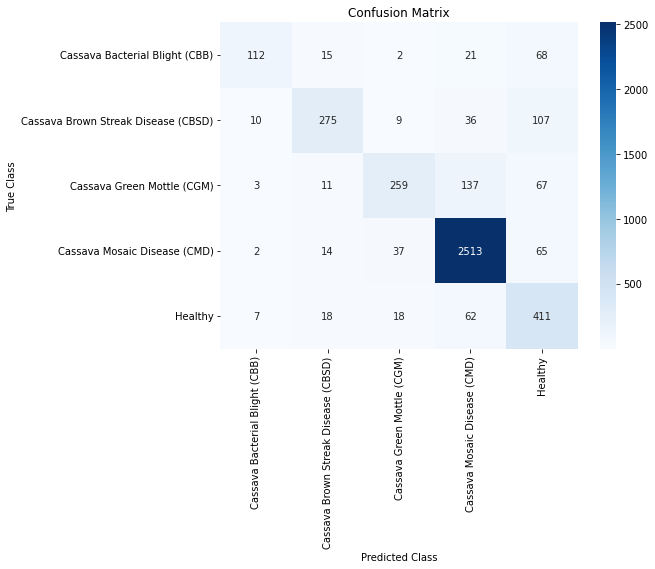

In [109]:
cm = confusion_matrix(validation_generator.classes, y_pred)
labels = ['Cassava Bacterial Blight (CBB)', 'Cassava Brown Streak Disease (CBSD)', 'Cassava Green Mottle (CGM)', 'Cassava Mosaic Disease (CMD)','Healthy']
plt.figure(figsize=(8,6))
sns.heatmap(cm,xticklabels=labels, yticklabels=labels, annot=True, fmt='d', cmap="Blues", vmin = 0.2);
plt.title('Confusion Matrix')
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.show()

In [110]:
pred = pd.DataFrame(y_pred, columns=['class_pred'])
pred['pred'] = pred['class_pred'].map({int(i) : c for i, c in disease_class.items()})

In [111]:
validation = df_train[df_train.kfold == 4].reset_index(drop=True)

image_ids_test = validation["image_id"].values
labels_test = validation["class"].values
pred_result = pred['pred'].values

In [112]:
rand_idxs = np.random.permutation(len(validation))[:9]

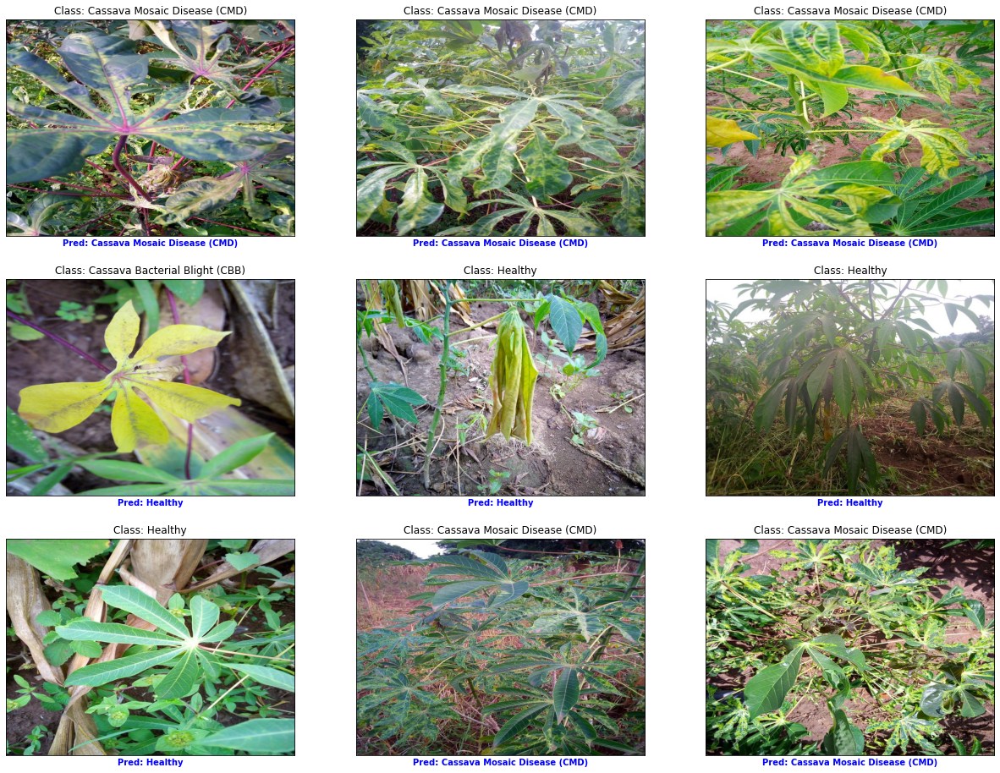

In [113]:
plot(image_ids_test[rand_idxs], labels_test[rand_idxs], pred_result[rand_idxs])
plt.show()

Of the three models (Base CNN, VGG16, ResNet101v2), ResNet101v2 shows the better performance overall.

### Model Comparision

In [145]:
# Training Accuracy
df_train_accuracy = pd.DataFrame(
    {'Fold': ['1', '2', '3', '4', '5'],
     'Base CNN': base_acc_average,
     'VGG16': vgg_acc_average,
     'ResNet101v2': resnet_acc_average
    })

df_train_accuracy

,Fold,Base CNN,VGG16,ResNet101v2
0,1,0.673599,0.723152,0.759748
1,2,0.742496,0.765920,0.796553
2,3,0.768618,0.769263,0.800269
3,4,0.782875,0.771644,0.812770
4,5,0.787310,0.778121,0.822783


In [146]:
# convert to long (tidy) form
df_train_accuracy_T = df_train_accuracy.melt('Fold', var_name='Model', value_name='Training Accuracy')
df_train_accuracy_T

,Fold,Model,Training Accuracy
0,1,Base CNN,0.673599
1,2,Base CNN,0.742496
2,3,Base CNN,0.768618
3,4,Base CNN,0.782875
4,5,Base CNN,0.787310
5,1,VGG16,0.723152
6,2,VGG16,0.765920
7,3,VGG16,0.769263
8,4,VGG16,0.771644
9,5,VGG16,0.778121


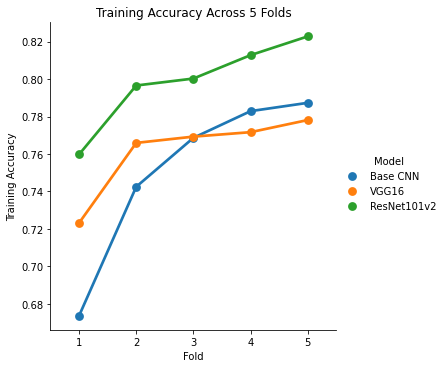

In [147]:
# plt.figure(figsize=(6,8))

sns.catplot(x="Fold", y="Training Accuracy", hue='Model', data=df_train_accuracy_T, kind='point')
plt.title("Training Accuracy Across 5 Folds")
plt.show()

In [148]:
# Validation Accuracy
df_val_accuracy = pd.DataFrame(
    {'Fold': ['1', '2', '3', '4', '5'], 
     'Base CNN': base_val_acc_average,
     'VGG16': vgg_val_acc_average,
     'ResNet101v2': resnet_val_acc_average
    })

df_val_accuracy

,Fold,Base CNN,VGG16,ResNet101v2
0,1,0.684439,0.728715,0.734953
1,2,0.749907,0.771963,0.797804
2,3,0.788736,0.762795,0.808775
3,4,0.796243,0.776233,0.799632
4,5,0.800576,0.766856,0.822856


In [149]:
# convert to long (tidy) form
df_val_accuracy_T = df_val_accuracy.melt('Fold', var_name='Model', value_name='Validation Accuracy')
df_val_accuracy_T

,Fold,Model,Validation Accuracy
0,1,Base CNN,0.684439
1,2,Base CNN,0.749907
2,3,Base CNN,0.788736
3,4,Base CNN,0.796243
4,5,Base CNN,0.800576
5,1,VGG16,0.728715
6,2,VGG16,0.771963
7,3,VGG16,0.762795
8,4,VGG16,0.776233
9,5,VGG16,0.766856


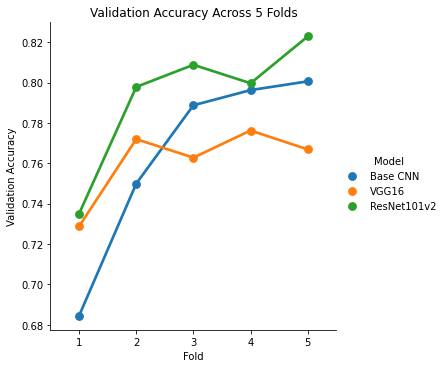

In [150]:
sns.catplot(x="Fold", y="Validation Accuracy", hue='Model', data=df_val_accuracy_T, kind='point')
plt.title("Validation Accuracy Across 5 Folds")
plt.show()

In [151]:
# Train Loss
df_train_loss = pd.DataFrame(
    {'Fold': ['1', '2', '3', '4', '5'], 
     'Base CNN': base_loss_average,
     'VGG16': vgg_loss_average,
     'ResNet101v2': resnet_loss_average
    })

df_train_loss

,Fold,Base CNN,VGG16,ResNet101v2
0,1,0.883429,0.759412,0.670985
1,2,0.698450,0.650231,0.569061
2,3,0.638109,0.635127,0.556093
3,4,0.603006,0.637893,0.521611
4,5,0.594972,0.618233,0.492839


In [152]:
df_train_loss_T = df_train_loss.melt('Fold', var_name='Model', value_name='Train Loss')
df_train_loss_T

,Fold,Model,Train Loss
0,1,Base CNN,0.883429
1,2,Base CNN,0.698450
2,3,Base CNN,0.638109
3,4,Base CNN,0.603006
4,5,Base CNN,0.594972
5,1,VGG16,0.759412
6,2,VGG16,0.650231
7,3,VGG16,0.635127
8,4,VGG16,0.637893
9,5,VGG16,0.618233


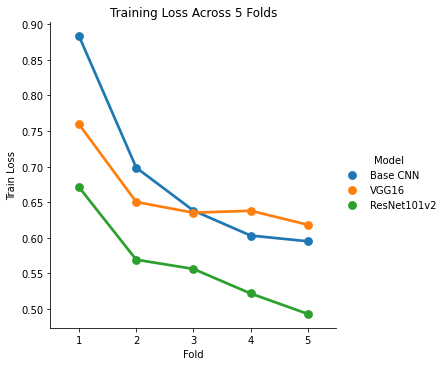

In [153]:
sns.catplot(x="Fold", y="Train Loss", hue='Model', data=df_train_loss_T, kind='point')
plt.title("Training Loss Across 5 Folds")
plt.show()

In [154]:
# Validation Loss
df_val_loss = pd.DataFrame(
    {'Fold': ['1', '2', '3', '4', '5'], 
     'Base CNN': base_val_loss_average,
     'VGG16': vgg_val_loss_average,
     'ResNet101v2': resnet_val_loss_average
    })

df_val_loss

,Fold,Base CNN,VGG16,ResNet101v2
0,1,0.857973,0.733585,0.739364
1,2,0.666019,0.615805,0.563458
2,3,0.582801,0.671589,0.537805
3,4,0.575075,0.611150,0.568478
4,5,0.552798,0.648550,0.499253


In [155]:
df_val_loss_T = df_val_loss.melt('Fold', var_name='Model', value_name='Validation Loss')
df_val_loss_T

,Fold,Model,Validation Loss
0,1,Base CNN,0.857973
1,2,Base CNN,0.666019
2,3,Base CNN,0.582801
3,4,Base CNN,0.575075
4,5,Base CNN,0.552798
5,1,VGG16,0.733585
6,2,VGG16,0.615805
7,3,VGG16,0.671589
8,4,VGG16,0.611150
9,5,VGG16,0.648550


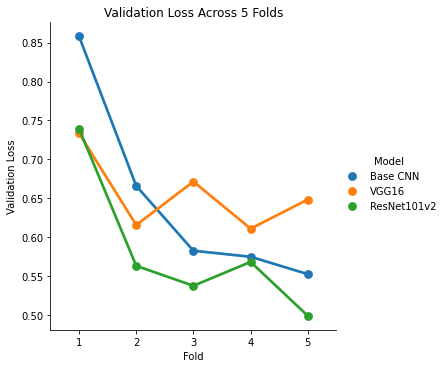

In [156]:
sns.catplot(x="Fold", y="Validation Loss", hue='Model', data=df_val_loss_T, kind='point')
plt.title("Validation Loss Across 5 Folds")
plt.show()